In [ ]:
!nvidia-smi

In [1]:
from transformers import (
    AutoTokenizer, AutoModelForCausalLM, AutoConfig,
    BitsAndBytesConfig
)
import bitsandbytes
from accelerate import infer_auto_device_map
from tqdm import tqdm

In [2]:
from datasets import Dataset, load_dataset
import torch
import random
import pandas as pd
from nnsight import LanguageModel

MODEL_PATH = '/home/gridsan/arunas/models/mistralai/Mistral-7B-v0.1/'
TOKENIZER_PATH = '/home/gridsan/arunas/tokenizers/mistralai/Mistral-7B-v0.1/'

In [3]:
model_path = f"{MODEL_PATH}"
tokenizer_path = f'{TOKENIZER_PATH}'
device="cuda:0"

In [4]:
config = AutoConfig.from_pretrained(model_path)

tokenizer = AutoTokenizer.from_pretrained(
    tokenizer_path, config=config, device_map="auto", padding_side="left"
)
tokenizer.pad_token = tokenizer.eos_token

In [5]:
model = LanguageModel(f'{model_path}', tokenizer=tokenizer, device_map="auto", load_in_4bit=True)

In [6]:
device_map = infer_auto_device_map(model)

In [7]:
device_map

{'': 0}

In [8]:
!nvidia-smi

Mon Feb  5 11:43:04 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-PCIE...  On   | 00000000:86:00.0 Off |                  Off |
| N/A   33C    P0    39W / 150W |    758MiB / 32768MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla V100-PCIE...  On   | 00000000:D8:00.0 Off |                  Off |
| N/A   

In [18]:
import torch
import torch.nn as nn

hook_handles = []
fValues = {}
bValues = {}
input_data = ["When John and Mary went to the store, John gave the bag to "]
count = 0
def get_forward_activation(name):
    def hook(module, input, output):
        fValues[name] = output[0]
    return hook
def get_back_activation(name):
    def bhook(module, gInput, gOutput):
        bValues[name] = gOutput[0]
    return bhook

def traverse_model(model, callback, parent_name=""):
    for name, module in model.named_children():
        module_name = f"{parent_name}.{name}" if parent_name else name
        callback(module, module_name, parent_name)
        if isinstance(module, nn.Module):
            traverse_model(module, callback, module_name)

def print_module_info(module, module_name, parent_name):
    handle = module.register_forward_hook(get_forward_activation(module_name))
    hook_handles.append(handle)
    handle = module.register_backward_hook(get_back_activation(module_name))
    hook_handles.append(handle)

def remove_hooks(hook_handles):
    for handle in hook_handles:
        handle.remove()

while(count < 10):
    print(input_data)
    hook_handles = []
    remove_hooks(hook_handles)
    traverse_model(model, print_module_info)
    
    model_input = tokenizer(input_data, return_tensors="pt").to(device)
    model.eval()
    
    # Forward pass
    with torch.no_grad():
        output_data = model.generate(**model_input, pad_token_id=tokenizer.eos_token_id, max_new_tokens=1)
        answer = tokenizer.batch_decode(output_data)[0]
        # print(answer)
        answer = answer.replace('<s> ', "")
    probs = fValues['lm_head']
    probs = torch.nn.functional.softmax(probs, dim=-1)
    topk_values, topk_indices = torch.topk(probs, k=1, dim=-1)
    
    topk_indices_list = topk_indices.squeeze().tolist()
    # print(topk_indices.squeeze().tolist())
    print([tokenizer.decode(index) for index in [topk_indices_list]])
    input_data[0] = answer
    count += 1

['When John and Mary went to the store, John gave the bag to ']


TypeError: 'Runner' object is not iterable

In [ ]:
print("\n".join(fValues.keys()))

In [ ]:
def get_activation(sentence, layer_num):
    tokens = tokenizer(sentence, return_tensors='pt')
    outputs = model(**tokens, output_hidden_states=True)
    layer_activations = outputs['hidden_states'][layer_num]
    return layer_activations

In [5]:
ngs = pd.read_csv('ngs.csv')

In [6]:
ngs.columns

Index(['Unnamed: 0', 'sentence', 'subordinate-sentence', 'passive-sentence',
       'it', 'it-r-1-null_subject', 'it-r-2-passive', 'it-r-3-subordinate',
       'it-u-1-negation', 'it-u-2-invert', 'it-u-3-gender', 'jp-r-1-sov',
       'jp-r-2-passive', 'jp-r-3-subordinate', 'jp-u-1-negation',
       'jp-u-2-invert', 'jp-u-3-past-tense', 'ng-sentence',
       'ng-subordinate-sentence', 'ng-passive-sentence', 'ng-it',
       'ng-it-r-1-null_subject', 'ng-it-r-2-passive', 'ng-it-r-3-subordinate',
       'ng-it-u-1-negation', 'ng-it-u-2-invert', 'ng-it-u-3-gender',
       'ng-jp-r-1-sov', 'ng-jp-r-2-passive', 'ng-jp-r-3-subordinate',
       'ng-jp-u-1-negation', 'ng-jp-u-2-invert', 'ng-jp-u-3-past-tense'],
      dtype='object')

In [7]:
ngs.drop(labels=['Unnamed: 0'], inplace=True, axis='columns')

In [20]:
mean_activations = {}
for col in ngs.columns[]:
    for layer in range(30, 33):
        print(f'Layer {layer}')
        mean_activations[layer] = {}
        activations = {}
        for row in list(ngs[col][:406]):
            curr_activation = get_activation(row, layer)
            for token_pos in range(len(row.split(" "))):
                if (not token_pos in activations):
                    activations[token_pos] = torch.unsqueeze(curr_activation[:, token_pos, :].clone(), dim=0)
                else:
                    activations[token_pos] = torch.cat([activations[token_pos], torch.unsqueeze(curr_activation[:, token_pos, :].clone(), dim=0)], dim=0)
        for token_pos in range(len(row.split(" "))):
            mean_activations[layer][token_pos] = round(torch.mean(torch.mean(activations[token_pos], axis=0), axis=1).item(), 2)

Layer 30
Layer 31
Layer 32
Layer 30
Layer 31
Layer 32


In [ ]:
mean_activations = {}
for layer in range(33):
    mean_activations[layer] = {}
    for token in range(len(activations[col][layer].keys())):
        mean_activations[layer][token] = 0
        mean_activations[layer][token] = round(torch.mean(torch.mean(torch.stack(activations['sentence'][layer][token], dim=0), axis=0), axis=1).item(), 2)

In [21]:
mean_activations

{30: {0: -0.08, 1: 0.0, 2: -0.0, 3: -0.0, 4: -0.0, 5: 0.0, 6: 0.0, 7: 0.0},
 31: {0: -0.08, 1: 0.0, 2: 0.0, 3: -0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0},
 32: {0: 0.01,
  1: 0.03,
  2: -0.04,
  3: -0.07,
  4: -0.06,
  5: -0.05,
  6: -0.05,
  7: -0.05}}

In [7]:
ngs[['sentence', 'ng-sentence']]

,sentence,ng-sentence
0,a dog carries a fish,dog a carries a fish
1,the dog holds the fish,holds dog the the fish
2,a dog takes a fish,dog a takes a fish
3,the dog brings the fish,dog the brings the fish
4,a dog carries the mouse,a dog the carries mouse
...,...,...
807,the girls read the chapter,the girls the read chapter
808,the boys read a book,the boys book a read
809,the boys read a poem,read boys the a poem
810,the boys read a story,the boys a read story


In [11]:
import circuitsvis as cv
import einops
import torch

from nnsight import LanguageModel

In [12]:
prompts = [
    "When John and Mary went to the shops, John gave the bag to",
    "When John and Mary went to the shops, Mary gave the bag to",
    "When Tom and James went to the park, James gave the ball to",
    "When Tom and James went to the park, Tom gave the ball to",
    # "When Dan and Sid went to the shops, Sid gave an apple to",
    # "When Dan and Sid went to the shops, Dan gave an apple to",
    # "After Martin and Amy went to the park, Amy gave a drink to",
    # "After Martin and Amy went to the park, Martin gave a drink to",
]
answers = [
    (" Mary", " John"),
    (" John", " Mary"),
    (" Tom", " James"),
    (" James", " Tom"),
    # (" Dan", " Sid"),
    # (" Sid", " Dan"),
    # (" Martin", " Amy"),
    # (" Amy", " Martin"),
]

In [13]:
clean_tokens = tokenizer(prompts, return_tensors="pt")["input_ids"].to(device)

corrupted_tokens = clean_tokens[
    [(i + 1 if i % 2 == 0 else i - 1) for i in range(len(clean_tokens))]
].to(device)

answer_token_indices = torch.tensor(
    [
        [tokenizer(answers[i][j])["input_ids"][0] for j in range(2)]
        for i in range(len(answers))
    ]
).to(device)

In [14]:
def ioi_metric(
    logits,
    CLEAN_BASELINE,
    CORRUPTED_BASELINE,
    answer_token_indices=answer_token_indices,
):
    return (get_logit_diff(logits, answer_token_indices) - CORRUPTED_BASELINE) / (
        CLEAN_BASELINE - CORRUPTED_BASELINE
    )


def get_logit_diff(logits, answer_token_indices=answer_token_indices):
    if len(logits.shape) == 3:
        # Get final logits only
        logits = logits[:, -1, :]
    correct_logits = logits.gather(1, answer_token_indices[:, 0].unsqueeze(1))
    incorrect_logits = logits.gather(1, answer_token_indices[:, 1].unsqueeze(1))
    return (correct_logits - incorrect_logits).mean()

In [15]:
model

MistralForCausalLM(
  (model): MistralModel(
    (embed_tokens): Embedding(32000, 4096)
    (layers): ModuleList(
      (0-31): 32 x MistralDecoderLayer(
        (self_attn): MistralAttention(
          (q_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (k_proj): Linear(in_features=4096, out_features=1024, bias=False)
          (v_proj): Linear(in_features=4096, out_features=1024, bias=False)
          (o_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (rotary_emb): MistralRotaryEmbedding()
        )
        (mlp): MistralMLP(
          (gate_proj): Linear(in_features=4096, out_features=14336, bias=False)
          (up_proj): Linear(in_features=4096, out_features=14336, bias=False)
          (down_proj): Linear(in_features=14336, out_features=4096, bias=False)
          (act_fn): SiLUActivation()
        )
        (input_layernorm): MistralRMSNorm()
        (post_attention_layernorm): MistralRMSNorm()
      )
    )
    (norm): MistralRM

In [16]:
model.lm_head.output

In [17]:
n_layers = 32
n_heads = 32
# model_input = tokenizer(prompts, return_tensors="pt")
clean_cache = []
with model.forward(inference=False) as runner:
    with runner.invoke(clean_tokens) as invoker:
        clean_logits = model.lm_head.output.save()

        clean_logit_diff = get_logit_diff(clean_logits, answer_token_indices).item()
        clean_cache = [
            model.model.layers[i].self_attn.output.save()
            for i in range(32)
        ]

        clean_grad_cache = [
            model.model.layers[i].self_attn.backward_output.save()
            for i in range(32)
        ]

    with runner.invoke(corrupted_tokens) as invoker:
        corrupted_logits = model.lm_head.output.save()

        corrupted_logit_diff = get_logit_diff(
            corrupted_logits, answer_token_indices
        ).item()

        corrupted_cache = [
            model.model.layers[i].self_attn.output.save()
            for i in range(32)
        ]

        corrupted_grad_cache = [
            model.model.layers[i].self_attn.backward_output.save()
            for i in range(32)
        ]

        clean_value = ioi_metric(
            clean_logits, clean_logit_diff, corrupted_logit_diff
        ).save()

        corrupted_value = ioi_metric(
            corrupted_logits, clean_logit_diff, corrupted_logit_diff
        ).save()

        (corrupted_value + clean_value).backward()

clean_cache = torch.stack([value.value[0] for value in clean_cache])
clean_grad_cache = torch.stack([value.value[0] for value in clean_grad_cache])
corrupted_cache = torch.stack([value.value[0] for value in corrupted_cache])
corrupted_grad_cache = torch.stack([value.value[0] for value in corrupted_grad_cache])

print("Clean Value:", clean_value.value.item())
print("Corrupted Value:", corrupted_value.value.item())


def create_attention_attr(clean_cache, clean_grad_cache):
    attention_attr = clean_grad_cache * clean_cache
    print(attention_attr.shape)
    attention_attr = einops.rearrange(
        attention_attr,
        "layer head_index dest src -> layer head_index dest src",
    )
    return attention_attr


attention_attr = create_attention_attr(clean_cache, clean_grad_cache)

HEAD_NAMES = [f"L{l}H{h}" for l in range(n_layers) for h in range(n_heads)]
HEAD_NAMES_SIGNED = [f"{name}{sign}" for name in HEAD_NAMES for sign in ["+", "-"]]
HEAD_NAMES_QKV = [
    f"{name}{act_name}" for name in HEAD_NAMES for act_name in ["Q", "K", "V"]
]
print(HEAD_NAMES[:5])
print(HEAD_NAMES_SIGNED[:5])
print(HEAD_NAMES_QKV[:5])


def plot_attention_attr(attention_attr, tokens, top_k=20, index=0, title=""):
    if len(tokens.shape) == 2:
        tokens = tokens[index]
    if len(attention_attr.shape) == 5:
        attention_attr = attention_attr[index]
    attention_attr_pos = attention_attr.clamp(min=-1e-5)
    attention_attr_neg = -attention_attr.clamp(max=1e-5)
    attention_attr_signed = torch.stack([attention_attr_pos, attention_attr_neg], dim=0)
    attention_attr_signed = einops.rearrange(
        attention_attr_signed,
        "sign layer head_index dest src -> (layer head_index sign) dest src",
    )
    attention_attr_signed = attention_attr_signed / attention_attr_signed.max()
    attention_attr_indices = (
        attention_attr_signed.max(-1).values.max(-1).values.argsort(descending=True)
    )


    attention_attr_signed = attention_attr_signed[attention_attr_indices, :, :]
    head_labels = [HEAD_NAMES_SIGNED[i.item()] for i in attention_attr_indices]

    tokens = [model.tokenizer.decode(token) for token in tokens]

    return cv.circuitsvis.attention.attention_heads(
        tokens=tokens,
        attention=attention_attr_signed[:top_k],
        attention_head_names=head_labels[:top_k],
    )

You're using a LlamaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.
2024-02-05 11:52:44.036171: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-05 11:52:44.080115: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-05 11:52:45.797798: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/gridsan/arunas/.l

Loading checkpoint shards:   0%|          | 0/6 [00:00<?, ?it/s]

/home/gridsan/arunas/.local/lib/python3.10/site-packages/bitsandbytes/nn/modules.py:226: UserWarning: Input type into Linear4bit is torch.float16, but bnb_4bit_compute_type=torch.float32 (default). This will lead to slow inference or training speed.
  warnings.warn(f'Input type into Linear4bit is torch.float16, but bnb_4bit_compute_type=torch.float32 (default). This will lead to slow inference or training speed.')


RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:1 and cuda:0! (when checking argument for argument index in method wrapper_CUDA_gather)

In [38]:
plot_attention_attr(
    attention_attr,
    clean_tokens,
    index=0,
    title="Attention Attribution for first sequence",
)

## General activations

In [8]:
ngs

,sentence,subordinate-sentence,passive-sentence,it,it-r-1-null_subject,it-r-2-passive,it-r-3-subordinate,it-u-1-negation,it-u-2-invert,it-u-3-gender,...,ng-it-r-3-subordinate,ng-it-u-1-negation,ng-it-u-2-invert,ng-it-u-3-gender,ng-jp-r-1-sov,ng-jp-r-2-passive,ng-jp-r-3-subordinate,ng-jp-u-1-negation,ng-jp-u-2-invert,ng-jp-u-3-past-tense
0,a dog carries a fish,Tom sees that the dog carries the fish,a fish is carried by a dog,kon dog carries kon fish,carries kon fish,kon fish is carried by kon dog,Tom sees that kon dog carries kon fish,kon dog carries kon no fish,fish kon carries dog kon,kon dog carries kon fish,...,Tom fish that kon dog carries kon sees,dog kon carries kon no fish,fish carries kon dog kon,carries dog kon kon fish,o dog wa a fish a carries,a fish reru a dog ni to carry wa,Tom carries the dog ga the fish o wa to sees,o dog wa no a fish a carries,a o fish a wa dog carries,dog wa a fish o-ta a to carry
1,the dog holds the fish,Leela claims that the dog holds the fish,the fish is held by the dog,kon dog holds kon fish,holds kon fish,kon fish is held by kon dog,Leela claims that kon dog holds kon fish,kon dog holds kon no fish,fish kon holds dog kon,kon dog holds kon fish,...,Leela claims that fish dog holds kon kon,fish dog holds kon no kon,holds kon fish dog kon,holds dog kon kon fish,the dog wa the fish holds o,the reru wa the dog ni to hold fish,Leela wa the dog ga the holds o fish to claims,the o wa no the fish dog holds,holds o fish the the dog wa,hold dog wa the fish o-ta to the
2,a dog takes a fish,Tom sees that the dog takes the fish,a fish is taken by a dog,kon dog takes kon fish,takes kon fish,kon fish is taken by kon dog,Tom sees that kon dog takes kon fish,kon dog takes kon no fish,fish kon takes dog kon,kon dog takes kon fish,...,Tom sees fish kon dog takes kon that,kon kon takes dog no fish,fish kon takes kon dog,kon kon takes dog fish,a dog wa a o fish takes,a fish wa a dog ni take to reru,Tom wa the dog ga the o fish takes to sees,wa dog a no a fish o takes,takes o wa a fish dog a,a dog wa a fish to o-ta take
3,the dog brings the fish,John says that the dog brings the fish,the fish is brought by the dog,kon dog brings kon fish,brings kon fish,kon fish is brought by kon dog,John says that kon dog brings kon fish,kon dog brings kon no fish,fish kon brings dog kon,kon dog brings kon fish,...,John says kon that dog brings kon fish,kon dog no kon brings fish,fish brings kon dog kon,kon dog fish kon brings,the the wa dog fish o brings,the fish wa the reru ni to bring dog,John says the dog ga the fish o brings to wa,the dog wa the no fish o brings,the o fish the wa dog brings,the dog wa the fish to o-ta bring
4,a dog carries the mouse,Tom sees that the dog carries the mouse,the mouse is carried by a dog,kon dog carries kon mouse,carries kon mouse,kon mouse is carried by kon dog,Tom sees that kon dog carries kon mouse,kon dog carries kon no mouse,mouse kon carries dog kon,kon dog carries kon mouse,...,mouse sees that kon dog carries kon Tom,kon kon carries dog no mouse,mouse dog carries kon kon,kon carries dog kon mouse,a dog wa mouse the o carries,to mouse wa a dog ni the carry reru,carries wa the dog ga the mouse o Tom to sees,a dog mouse no the wa o carries,carries o mouse dog wa the a,a dog wa the mouse carry to o-ta
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
807,the girls read the chapter,John notices that the girls read the chapter,the chapter is read by the girls,kars girls read kon chapter,read kon chapter,kon chapter is read by kars girls,John notices that kars girls read kon chapter,kars girls read kon no chapter,chapter kon read girls kars,kars girls read kars chapter,...,John notices that girls kars read kon chapter,kars no read kon girls chapter,read kon chapter girls kars,kars girls chapter kars read,the girls the wa chapter o read,the chapter to the girls ni wa read reru,John wa the girls ga the notices o read to cha...,the girls no wa the chapter o

In [9]:
ngs.columns

Index(['sentence', 'subordinate-sentence', 'passive-sentence', 'it',
       'it-r-1-null_subject', 'it-r-2-passive', 'it-r-3-subordinate',
       'it-u-1-negation', 'it-u-2-invert', 'it-u-3-gender', 'jp-r-1-sov',
       'jp-r-2-passive', 'jp-r-3-subordinate', 'jp-u-1-negation',
       'jp-u-2-invert', 'jp-u-3-past-tense', 'ng-sentence',
       'ng-subordinate-sentence', 'ng-passive-sentence', 'ng-it',
       'ng-it-r-1-null_subject', 'ng-it-r-2-passive', 'ng-it-r-3-subordinate',
       'ng-it-u-1-negation', 'ng-it-u-2-invert', 'ng-it-u-3-gender',
       'ng-jp-r-1-sov', 'ng-jp-r-2-passive', 'ng-jp-r-3-subordinate',
       'ng-jp-u-1-negation', 'ng-jp-u-2-invert', 'ng-jp-u-3-past-tense'],
      dtype='object')

In [10]:
import seaborn as sns 
import pandas as pd
import matplotlib.pyplot as plt

def make_heatmap(sentence1, sentence2, sentence3, sentence4, cmap, title=""):
    fig, (ax1,ax2,ax3,ax4) = plt.subplots(ncols=4, figsize=(100,50))
    fig.subplots_adjust(wspace=0.5)
    sns.set(font_scale=5)

    df = pd.DataFrame.from_dict(sentence1)
    sns.heatmap(df.T, cmap=cmap, ax=ax1,linewidths=.5, vmin=-0.16, vmax=0.12)
    df = pd.DataFrame.from_dict(sentence2)
    sns.heatmap(df.T, cmap=cmap, ax=ax2, linewidths=.5, vmin=-0.16, vmax=0.12)
    df = pd.DataFrame.from_dict(sentence3)
    sns.heatmap(df.T, cmap=cmap, ax=ax3, linewidths=.5, vmin=-0.16, vmax=0.12)
    df = pd.DataFrame.from_dict(sentence4)
    sns.heatmap(df.T, cmap=cmap, ax=ax4,linewidths=.5, vmin=-0.16, vmax=0.12)
    fig.suptitle(title, fontsize=100)
    plt.show()


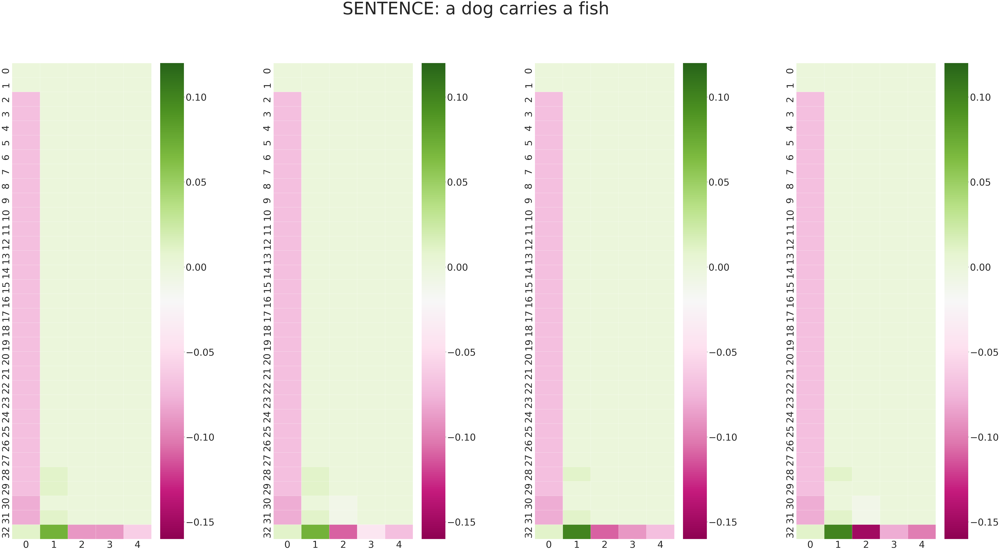

'a dog carries a fish'

In [11]:
sentence1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": 0.0}, "29": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.0, "4": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.0, "3": -0.0, "4": 0.0}, "32": {"0": 0.01, "1": 0.07, "2": -0.09, "3": -0.09, "4": -0.06}}
sentence2 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": 0.0, "4": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": 0.0, "4": -0.0}, "32": {"0": 0.01, "1": 0.07, "2": -0.11, "3": -0.04, "4": -0.07}}
sentence3 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.0, "3": -0.0, "4": 0.0}, "32": {"0": 0.01, "1": 0.1, "2": -0.11, "3": -0.09, "4": -0.07}}
sentence4 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": 0.0, "4": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": -0.0, "4": -0.0}, "32": {"0": 0.01, "1": 0.1, "2": -0.15, "3": -0.08, "4": -0.1}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "PiYG", "SENTENCE: a dog carries a fish")
ngs['sentence'][0]

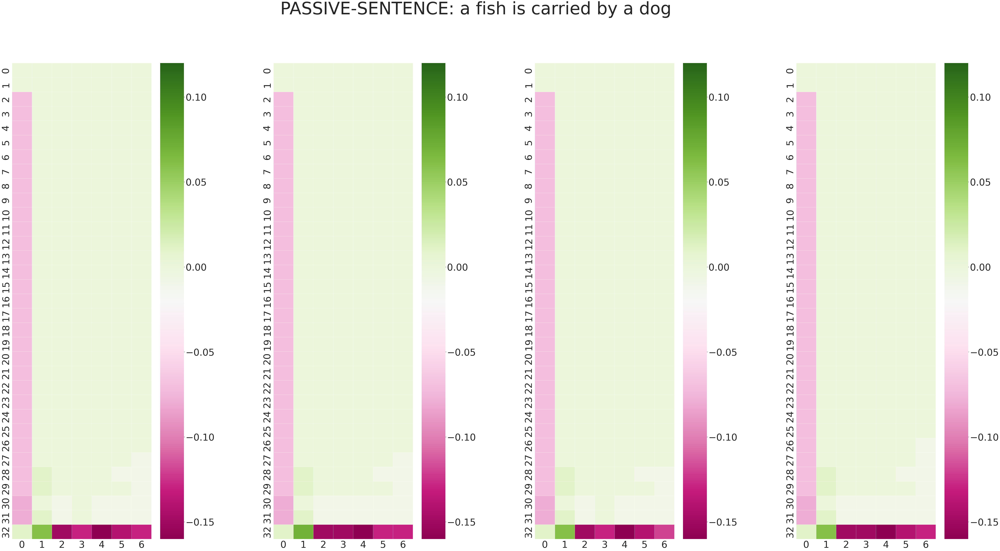

'a fish is carried by a dog'

In [12]:
sentence1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.01}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.01}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.01}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.01, "5": -0.01, "6": -0.01}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": -0.0, "4": -0.01, "5": -0.01, "6": -0.01}, "32": {"0": 0.01, "1": 0.06, "2": -0.15, "3": -0.13, "4": -0.17, "5": -0.14, "6": -0.13}}
sentence2 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.01}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.01}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.01}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.01, "4": -0.01, "5": -0.01, "6": -0.01}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": -0.01, "4": -0.01, "5": -0.01, "6": -0.01}, "32": {"0": 0.01, "1": 0.07, "2": -0.15, "3": -0.15, "4": -0.19, "5": -0.13, "6": -0.13}}
sentence3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.01}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.01}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.01, "5": -0.01, "6": -0.01}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": -0.0, "4": -0.01, "5": -0.01, "6": -0.01}, "32": {"0": 0.01, "1": 0.06, "2": -0.15, "3": -0.13, "4": -0.17, "5": -0.14, "6": -0.12}}
sentence4 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.01}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.01}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.01}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.01}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.01, "4": -0.01, "5": -0.01, "6": -0.01}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": -0.01, "4": -0.01, "5": -0.01, "6": -0.01}, "32": {"0": 0.01, "1": 0.06, "2": -0.15, "3": -0.15, "4": -0.19, "5": -0.14, "6": -0.13}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "PiYG", "PASSIVE-SENTENCE: a fish is carried by a dog")
ngs['passive-sentence'][0]

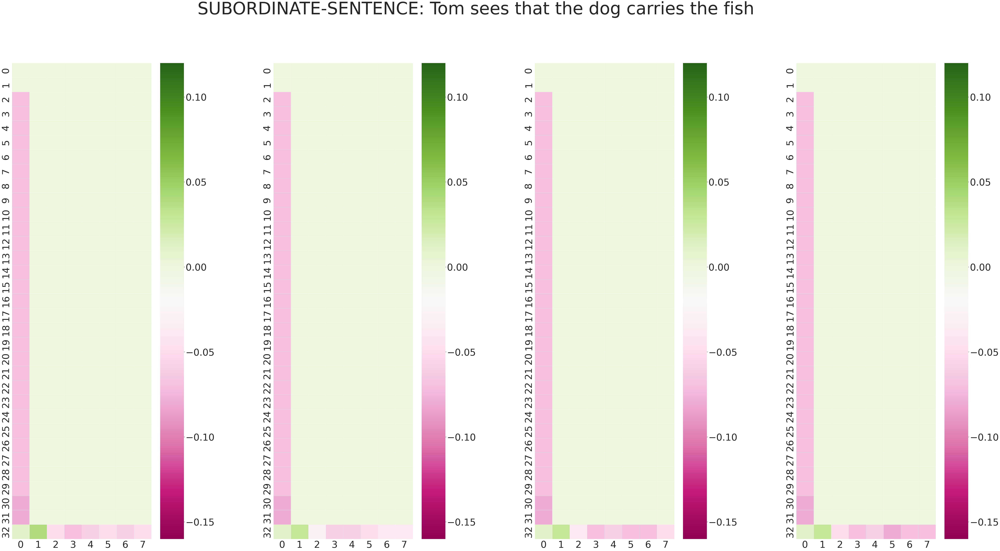

'Tom sees that the dog carries the fish'

In [13]:
sentence1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": -0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "32": {"0": 0.01, "1": 0.04, "2": -0.05, "3": -0.07, "4": -0.06, "5": -0.05, "6": -0.06, "7": -0.05}}
sentence2 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": -0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "32": {"0": 0.01, "1": 0.03, "2": -0.03, "3": -0.06, "4": -0.06, "5": -0.05, "6": -0.04, "7": -0.04}}
sentence3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "26": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "32": {"0": 0.01, "1": 0.03, "2": -0.04, "3": -0.07, "4": -0.06, "5": -0.07, "6": -0.07, "7": -0.05}}
sentence4 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0}, "26": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": -0.0}, "32": {"0": 0.01, "1": 0.03, "2": -0.05, "3": -0.07, "4": -0.06, "5": -0.08, "6": -0.07, "7": -0.07}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "PiYG", "SUBORDINATE-SENTENCE: Tom sees that the dog carries the fish")
ngs['subordinate-sentence'][0]

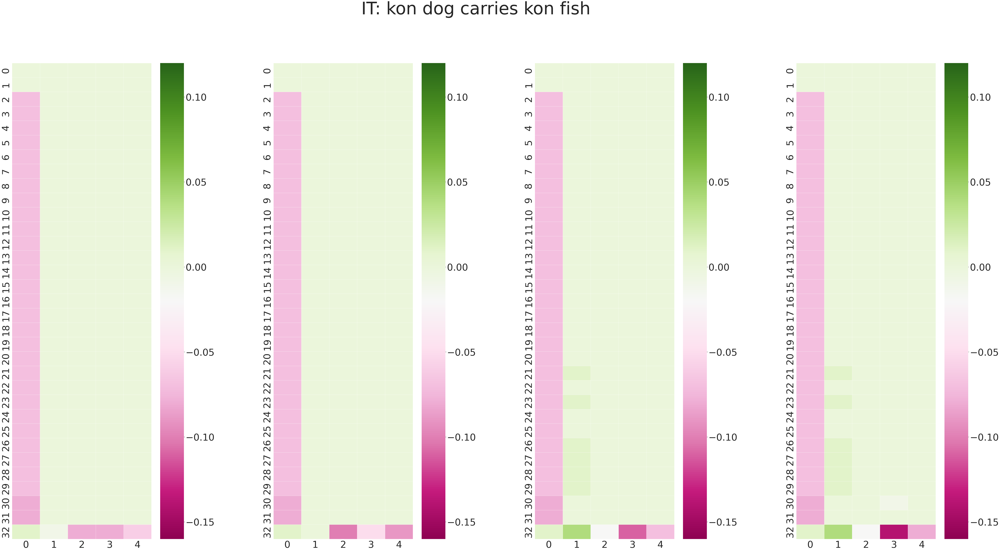

'kon dog carries kon fish'

In [14]:
sentence1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "30": {"0": -0.08, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "31": {"0": -0.08, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "32": {"0": 0.01, "1": -0.01, "2": -0.08, "3": -0.08, "4": -0.06}}
sentence2 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "32": {"0": 0.01, "1": -0.0, "2": -0.1, "3": -0.05, "4": -0.09}}
sentence3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "26": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0}, "27": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.0, "4": -0.0}, "29": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "32": {"0": 0.01, "1": 0.04, "2": -0.02, "3": -0.11, "4": -0.07}}
sentence4 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "26": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0}, "27": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": -0.0}, "29": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.01, "4": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "32": {"0": 0.01, "1": 0.04, "2": -0.02, "3": -0.14, "4": -0.08}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "PiYG", "IT: kon dog carries kon fish")
ngs['it'][0]

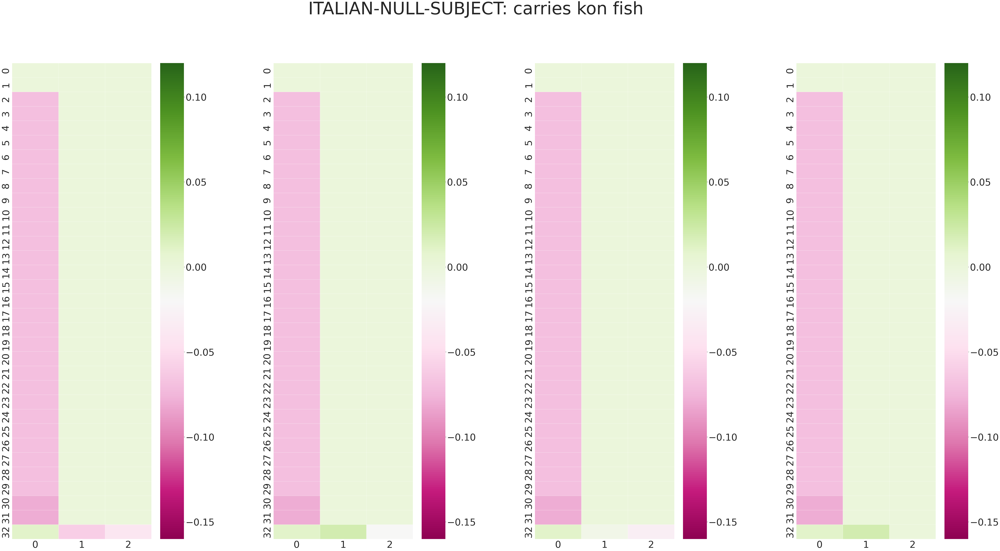

'carries kon fish'

In [18]:
sentence1 = {"0": {"0": -0.0, "1": -0.0, "2": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0}, "9": {"0": -0.07, "1": 0.0, "2": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0}, "19": {"0": -0.07, "1": -0.0, "2": 0.0}, "20": {"0": -0.07, "1": -0.0, "2": 0.0}, "21": {"0": -0.07, "1": -0.0, "2": 0.0}, "22": {"0": -0.07, "1": -0.0, "2": 0.0}, "23": {"0": -0.07, "1": -0.0, "2": 0.0}, "24": {"0": -0.07, "1": -0.0, "2": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": -0.0}, "26": {"0": -0.07, "1": -0.0, "2": 0.0}, "27": {"0": -0.07, "1": -0.0, "2": 0.0}, "28": {"0": -0.07, "1": -0.0, "2": 0.0}, "29": {"0": -0.07, "1": -0.0, "2": 0.0}, "30": {"0": -0.08, "1": -0.0, "2": -0.0}, "31": {"0": -0.08, "1": -0.0, "2": -0.0}, "32": {"0": 0.01, "1": -0.06, "2": -0.04}}
sentence2 = {"0": {"0": -0.0, "1": -0.0, "2": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0}, "32": {"0": 0.01, "1": 0.02, "2": -0.02}}
sentence3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0}, "23": {"0": -0.07, "1": -0.0, "2": 0.0}, "24": {"0": -0.07, "1": -0.0, "2": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": 0.0}, "26": {"0": -0.07, "1": -0.0, "2": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0}, "32": {"0": 0.01, "1": -0.01, "2": -0.03}}
sentence4 = {"0": {"0": -0.0, "1": -0.0, "2": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": 0.0}, "26": {"0": -0.07, "1": -0.0, "2": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0}, "32": {"0": 0.01, "1": 0.02, "2": -0.0}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "PiYG", "ITALIAN-NULL-SUBJECT: carries kon fish")
ngs['it-r-1-null_subject'][0]

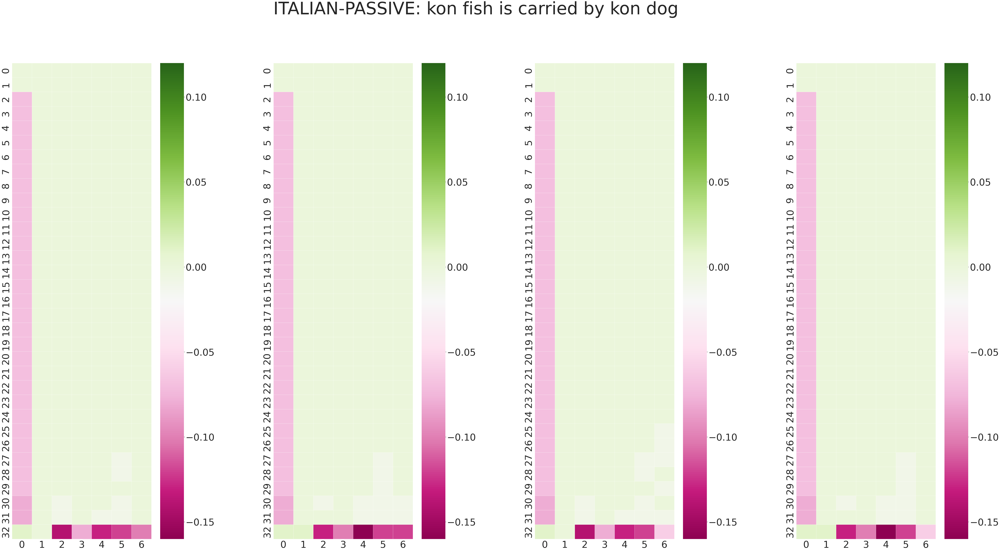

'kon fish is carried by kon dog'

In [20]:
sentence1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.01, "5": -0.01, "6": -0.0}, "32": {"0": 0.01, "1": 0.0, "2": -0.14, "3": -0.08, "4": -0.13, "5": -0.12, "6": -0.1}}
sentence2 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.01, "5": -0.01, "6": -0.01}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.01, "5": -0.01, "6": -0.01}, "32": {"0": 0.01, "1": 0.01, "2": -0.13, "3": -0.1, "4": -0.16, "5": -0.12, "6": -0.12}}
sentence3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.01}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.01}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.01}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.01}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.01, "5": -0.01, "6": -0.01}, "32": {"0": 0.01, "1": 0.0, "2": -0.14, "3": -0.08, "4": -0.13, "5": -0.12, "6": -0.06}}
sentence4 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.01, "6": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.01, "5": -0.01, "6": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.01, "5": -0.01, "6": -0.0}, "32": {"0": 0.01, "1": 0.01, "2": -0.13, "3": -0.1, "4": -0.16, "5": -0.12, "6": -0.06}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "PiYG", "ITALIAN-PASSIVE: kon fish is carried by kon dog")

ngs['it-r-2-passive'][0]

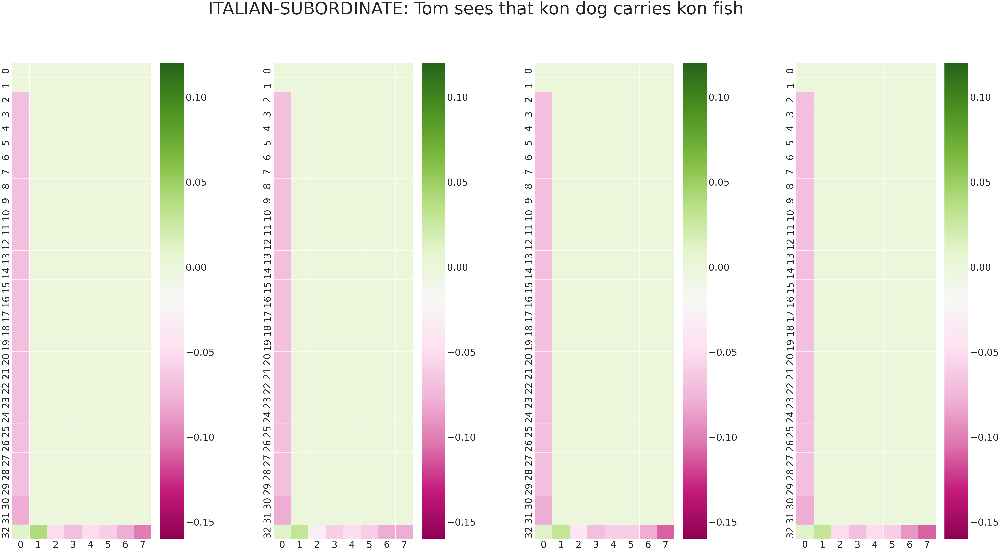

'Tom sees that kon dog carries kon fish'

In [21]:
sentence1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0}, "32": {"0": 0.01, "1": 0.04, "2": -0.05, "3": -0.07, "4": -0.05, "5": -0.06, "6": -0.08, "7": -0.1}}
sentence2 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "32": {"0": 0.01, "1": 0.03, "2": -0.03, "3": -0.06, "4": -0.05, "5": -0.06, "6": -0.08, "7": -0.08}}
sentence3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "25": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "26": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "32": {"0": 0.01, "1": 0.03, "2": -0.04, "3": -0.07, "4": -0.06, "5": -0.06, "6": -0.08, "7": -0.11}}
sentence4 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": -0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "25": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "26": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "32": {"0": 0.01, "1": 0.03, "2": -0.05, "3": -0.07, "4": -0.05, "5": -0.06, "6": -0.09, "7": -0.11}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "PiYG", "ITALIAN-SUBORDINATE: Tom sees that kon dog carries kon fish")

ngs['it-r-3-subordinate'][0]

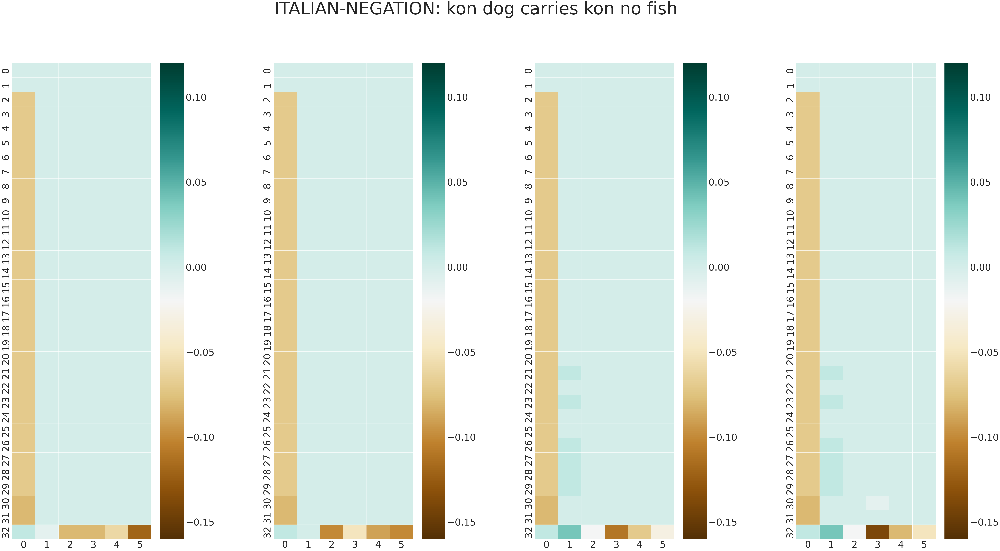

'kon dog carries kon no fish'

In [22]:
sentence1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "9": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "30": {"0": -0.08, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0}, "31": {"0": -0.08, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0}, "32": {"0": 0.01, "1": -0.01, "2": -0.08, "3": -0.08, "4": -0.06, "5": -0.12}}
sentence2 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0}, "32": {"0": 0.01, "1": -0.0, "2": -0.1, "3": -0.05, "4": -0.09, "5": -0.1}}
sentence3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "21": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "23": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0}, "26": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0}, "27": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "29": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0}, "32": {"0": 0.01, "1": 0.04, "2": -0.02, "3": -0.11, "4": -0.07, "5": -0.03}}
sentence4 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "21": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0}, "23": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0}, "26": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0}, "27": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0}, "29": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.01, "4": -0.0, "5": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0}, "32": {"0": 0.01, "1": 0.04, "2": -0.02, "3": -0.14, "4": -0.08, "5": -0.05}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "BrBG", "ITALIAN-NEGATION: kon dog carries kon no fish")
ngs['it-u-1-negation'][0]

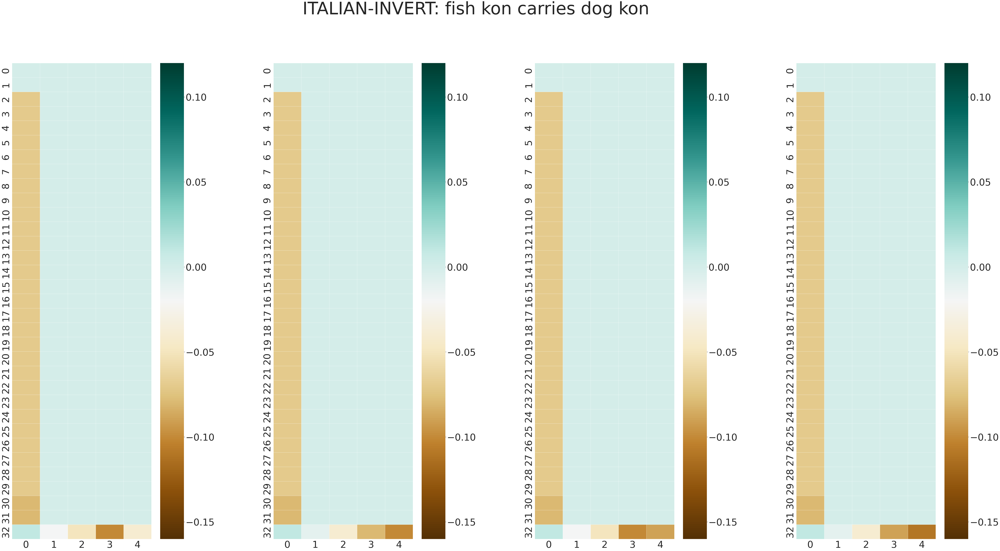

'fish kon carries dog kon'

In [107]:
sentence1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "11": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "30": {"0": -0.08, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "32": {"0": 0.01, "1": -0.02, "2": -0.05, "3": -0.1, "4": -0.04}}
sentence2 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "32": {"0": 0.01, "1": -0.01, "2": -0.04, "3": -0.08, "4": -0.1}}
sentence3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "30": {"0": -0.08, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "32": {"0": 0.01, "1": -0.02, "2": -0.05, "3": -0.1, "4": -0.09}}
sentence4 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "32": {"0": 0.01, "1": -0.01, "2": -0.04, "3": -0.09, "4": -0.11}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "BrBG", "ITALIAN-INVERT: fish kon carries dog kon")
ngs['it-u-2-invert'][0]

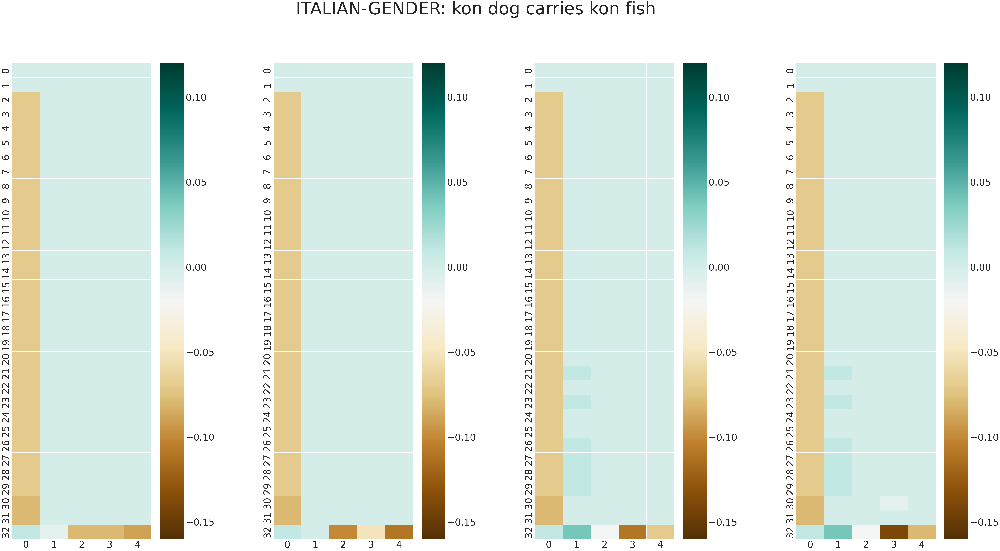

'kon dog holds kon mouse'

In [108]:
sentence1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "30": {"0": -0.08, "1": -0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "31": {"0": -0.08, "1": -0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "32": {"0": 0.01, "1": -0.01, "2": -0.08, "3": -0.08, "4": -0.09}}
sentence2 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "32": {"0": 0.01, "1": -0.0, "2": -0.1, "3": -0.05, "4": -0.11}}
sentence3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0}, "26": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0}, "27": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.0, "4": -0.0}, "29": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "32": {"0": 0.01, "1": 0.04, "2": -0.02, "3": -0.11, "4": -0.07}}
sentence4 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "2": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "4": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "21": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0}, "23": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "26": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0}, "27": {"0": -0.07, "1": 0.01, "2": -0.0, "3": -0.0, "4": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": -0.0}, "29": {"0": -0.07, "1": 0.01, "2": 0.0, "3": -0.0, "4": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.01, "4": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0}, "32": {"0": 0.01, "1": 0.04, "2": -0.02, "3": -0.14, "4": -0.08}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "BrBG", "ITALIAN-GENDER: kon dog carries kon fish")
ngs['it-u-3-gender'][5]

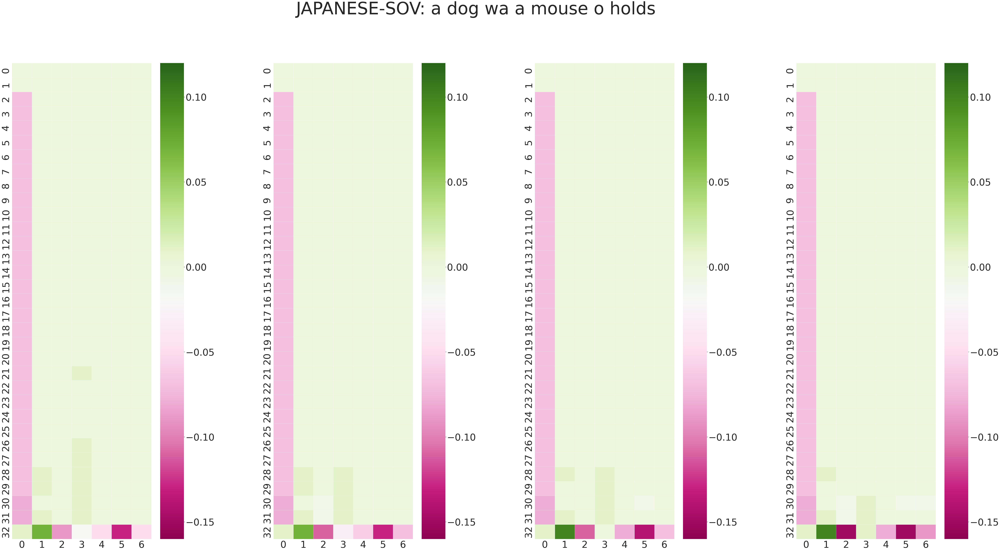

'a dog wa a mouse o holds'

In [98]:
sentence1 = jp_r_1_sov1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.01, "4": 0.0, "5": 0.0, "6": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.01, "4": 0.0, "5": 0.0, "6": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.01, "4": 0.0, "5": 0.0, "6": 0.0}, "29": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0}, "32": {"0": 0.01, "1": 0.07, "2": -0.09, "3": -0.02, "4": -0.05, "5": -0.13, "6": -0.05}}
sentence2 = jp_r_1_sov2 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0}, "32": {"0": 0.01, "1": 0.07, "2": -0.11, "3": -0.03, "4": -0.06, "5": -0.13, "6": -0.07}}
sentence3 = jp_r_1_sov3 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.01, "4": -0.0, "5": -0.01, "6": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0}, "32": {"0": 0.01, "1": 0.1, "2": -0.11, "3": 0.0, "4": -0.08, "5": -0.14, "6": -0.07}}
sentence4 = jp_r_1_sov4 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": 0.01, "4": -0.0, "5": -0.01, "6": -0.01}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0}, "32": {"0": 0.01, "1": 0.1, "2": -0.15, "3": 0.01, "4": -0.08, "5": -0.15, "6": -0.09}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "PiYG", "JAPANESE-SOV: a dog wa a mouse o holds")

ngs['jp-r-1-sov'][5]

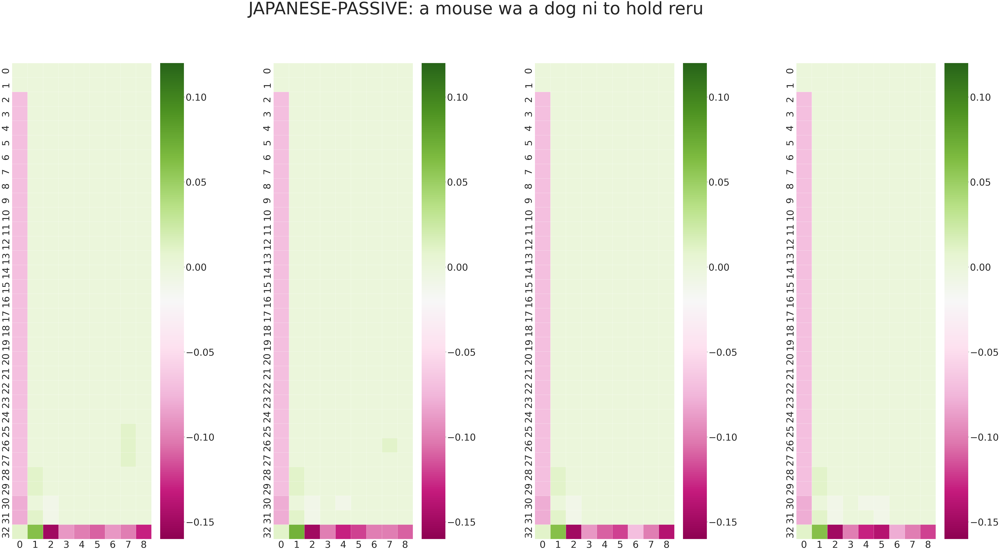

'a mouse wa a dog ni to hold reru'

In [99]:
sentence1 = jp_r_2_passive1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.01, "8": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.01, "8": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.01, "8": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0}, "32": {"0": 0.01, "1": 0.06, "2": -0.15, "3": -0.09, "4": -0.1, "5": -0.11, "6": -0.09, "7": -0.1, "8": -0.13}}
sentence2 = jp_r_2_passive2 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.01, "8": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.01, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "32": {"0": 0.01, "1": 0.07, "2": -0.15, "3": -0.1, "4": -0.13, "5": -0.12, "6": -0.1, "7": -0.1, "8": -0.11}}
sentence3 = jp_r_2_passive3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0}, "32": {"0": 0.01, "1": 0.06, "2": -0.15, "3": -0.09, "4": -0.11, "5": -0.12, "6": -0.07, "7": -0.1, "8": -0.14}}
sentence4 = jp_r_2_passive4 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": 0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.01, "5": -0.01, "6": 0.0, "7": 0.0, "8": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": -0.0, "4": -0.0, "5": -0.01, "6": 0.0, "7": 0.0, "8": 0.0}, "32": {"0": 0.01, "1": 0.06, "2": -0.15, "3": -0.1, "4": -0.13, "5": -0.14, "6": -0.08, "7": -0.1, "8": -0.12}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "PiYG", "JAPANESE-PASSIVE: a mouse wa a dog ni to hold reru")

ngs['jp-r-2-passive'][5]

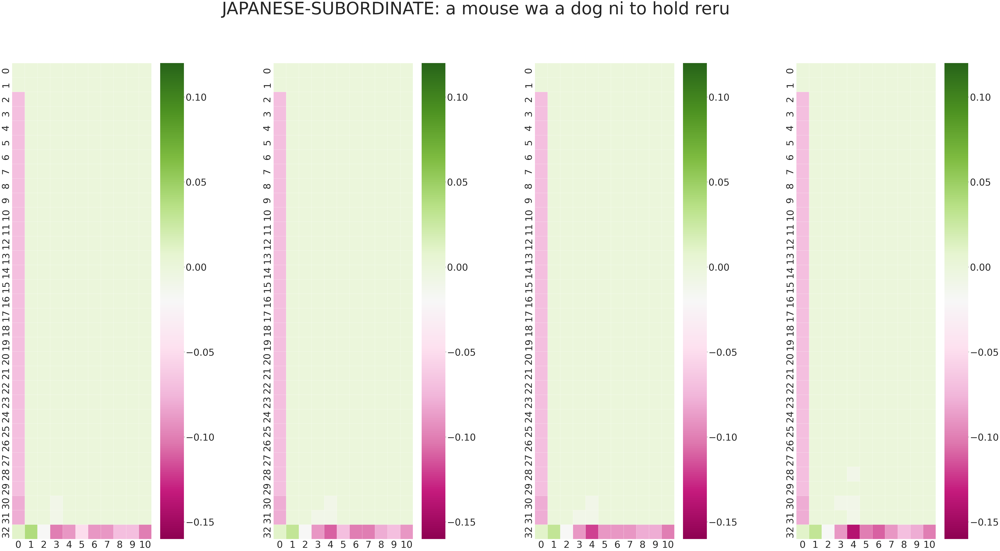

'John wa the dog ga the mouse o holds to says'

In [100]:
sentence1 = jp_r_3_subordinate1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": -0.0, "10": -0.0}, "2": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": -0.0, "10": -0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0, "10": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.01, "4": -0.0, "5": 0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0, "10": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.01, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": -0.0, "9": 0.0, "10": 0.0}, "32": {"0": 0.01, "1": 0.04, "2": -0.02, "3": -0.1, "4": -0.09, "5": -0.05, "6": -0.09, "7": -0.09, "8": -0.07, "9": -0.07, "10": -0.1}}
sentence2 = jp_r_3_subordinate2 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0, "10": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": 0.0, "9": -0.0, "10": -0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": -0.0, "10": -0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": -0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": -0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": -0.0, "9": 0.0, "10": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.01, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0, "10": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.01, "4": -0.01, "5": 0.0, "6": -0.0, "7": 0.0, "8": -0.0, "9": 0.0, "10": 0.0}, "32": {"0": 0.01, "1": 0.03, "2": -0.02, "3": -0.09, "4": -0.11, "5": -0.07, "6": -0.1, "7": -0.1, "8": -0.08, "9": -0.07, "10": -0.09}}
sentence3 = jp_r_3_subordinate3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": -0.0, "10": -0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "22": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "23": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "26": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0, "10": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.01, "5": 0.0, "6": -0.0, "7": 0.0, "8": -0.0, "9": 0.0, "10": 0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.01, "4": -0.01, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0, "10": 0.0}, "32": {"0": 0.01, "1": 0.03, "2": -0.02, "3": -0.09, "4": -0.12, "5": -0.09, "6": -0.09, "7": -0.09, "8": -0.08, "9": -0.08, "10": -0.1}}
sentence4 = jp_r_3_subordinate4 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": -0.0, "10": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": -0.0, "10": -0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "13": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "14": {"0": -0.07, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": -0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "26": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": -0.0, "9": 0.0, "10": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.01, "5": 0.0, "6": -0.0, "7": 0.0, "8": 0.0, "9": 0.0, "10": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0, "8": -0.0, "9": 0.0, "10": 0.0}, "30": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.01, "4": -0.01, "5": 0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0, "10": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.01, "5": 0.0, "6": -0.0, "7": 0.0, "8": -0.0, "9": 0.0, "10": 0.0}, "32": {"0": 0.01, "1": 0.03, "2": -0.02, "3": -0.09, "4": -0.14, "5": -0.1, "6": -0.11, "7": -0.09, "8": -0.07, "9": -0.08, "10": -0.1}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "PiYG", "JAPANESE-SUBORDINATE: a mouse wa a dog ni to hold reru")

ngs['jp-r-3-subordinate'][5]


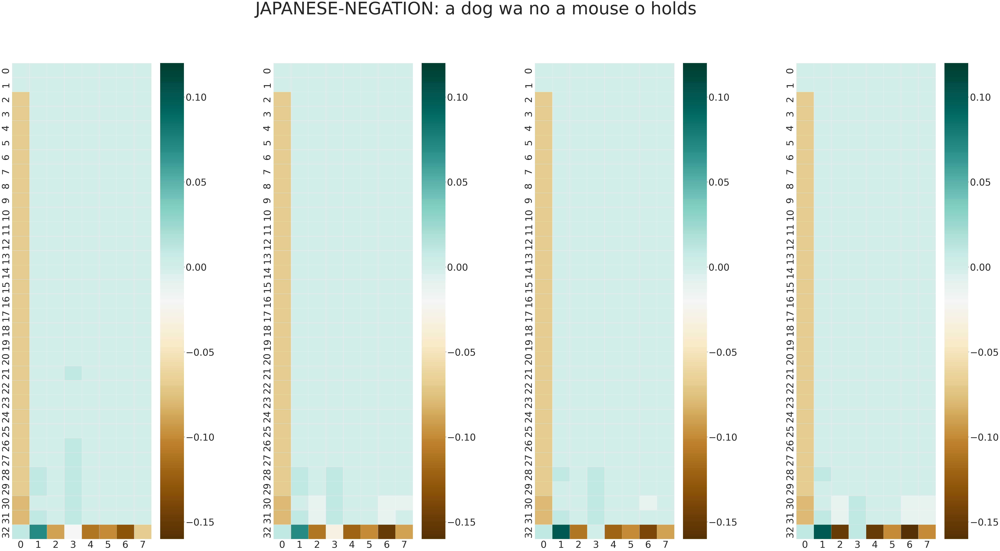

'a dog wa no a mouse o holds'

In [109]:
sentence1 = jp_u_1_negation1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.01, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0, "7": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "29": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.0, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "32": {"0": 0.01, "1": 0.07, "2": -0.09, "3": -0.02, "4": -0.11, "5": -0.1, "6": -0.13, "7": -0.07}}
sentence2 = jp_u_1_negation2 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.01, "7": -0.01}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.01, "7": -0.0}, "32": {"0": 0.01, "1": 0.07, "2": -0.11, "3": -0.03, "4": -0.12, "5": -0.1, "6": -0.15, "7": -0.09}}
sentence3 = jp_u_1_negation3 =  {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.01, "7": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.0, "3": 0.01, "4": -0.0, "5": 0.0, "6": -0.0, "7": -0.0}, "32": {"0": 0.01, "1": 0.1, "2": -0.11, "3": 0.0, "4": -0.12, "5": -0.1, "6": -0.14, "7": -0.09}}
sentence4 = jp_u_1_negation4 =  {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": -0.0, "7": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.01, "7": -0.01}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": 0.01, "4": -0.0, "5": 0.0, "6": -0.01, "7": -0.01}, "32": {"0": 0.01, "1": 0.1, "2": -0.15, "3": 0.01, "4": -0.15, "5": -0.1, "6": -0.16, "7": -0.1}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "BrBG", "JAPANESE-NEGATION: a dog wa no a mouse o holds")

ngs['jp-u-1-negation'][5]


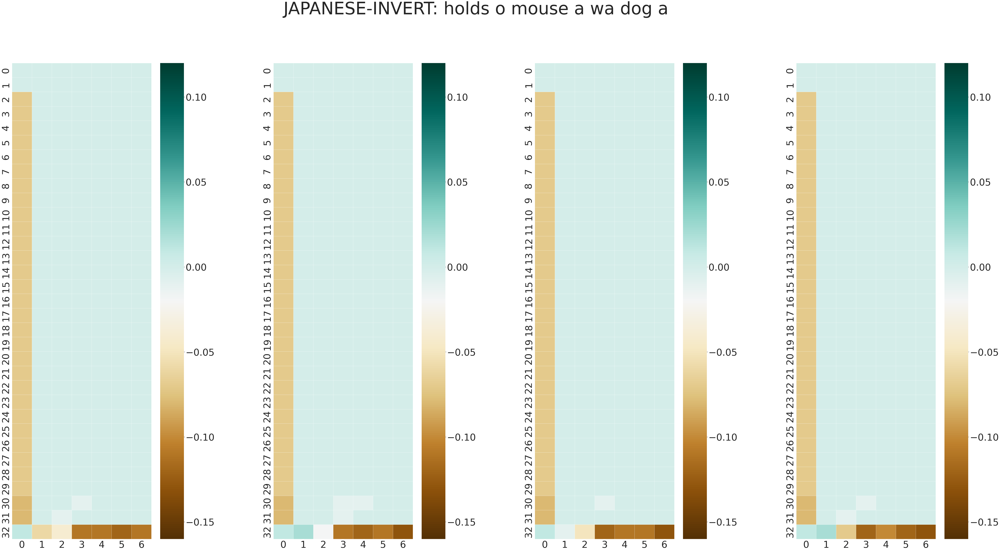

'holds o mouse a wa dog a'

In [110]:
sentence1 = jp_u_2_invert1 = {"0": {"0": -0.0, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "19": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "20": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "21": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "22": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "23": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "24": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "26": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "27": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "28": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "29": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "30": {"0": -0.08, "1": -0.0, "2": -0.0, "3": -0.01, "4": -0.0, "5": -0.0, "6": -0.0}, "31": {"0": -0.08, "1": -0.0, "2": -0.01, "3": -0.0, "4": -0.0, "5": -0.0, "6": 0.0}, "32": {"0": 0.01, "1": -0.06, "2": -0.04, "3": -0.11, "4": -0.11, "5": -0.12, "6": -0.11}}
sentence2 = jp_u_2_invert2 = {"0": {"0": -0.0, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "3": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "28": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.01, "4": -0.01, "5": -0.0, "6": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.01, "4": -0.0, "5": -0.0, "6": -0.0}, "32": {"0": 0.01, "1": 0.02, "2": -0.02, "3": -0.11, "4": -0.12, "5": -0.11, "6": -0.13}}
sentence3 = jp_u_2_invert3 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "1": {"0": -0.0, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "23": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "24": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "26": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.01, "4": -0.0, "5": -0.0, "6": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "32": {"0": 0.01, "1": -0.01, "2": -0.05, "3": -0.12, "4": -0.11, "5": -0.11, "6": -0.13}}
sentence4 = jp_u_2_invert4 = {"0": {"0": -0.0, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0}, "25": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "26": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "28": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": -0.01, "4": -0.0, "5": -0.0, "6": -0.0}, "31": {"0": -0.08, "1": 0.0, "2": -0.01, "3": -0.0, "4": -0.0, "5": -0.0, "6": -0.0}, "32": {"0": 0.01, "1": 0.02, "2": -0.07, "3": -0.12, "4": -0.1, "5": -0.12, "6": -0.13}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "BrBG", "JAPANESE-INVERT: holds o mouse a wa dog a")

ngs['jp-u-2-invert'][5]


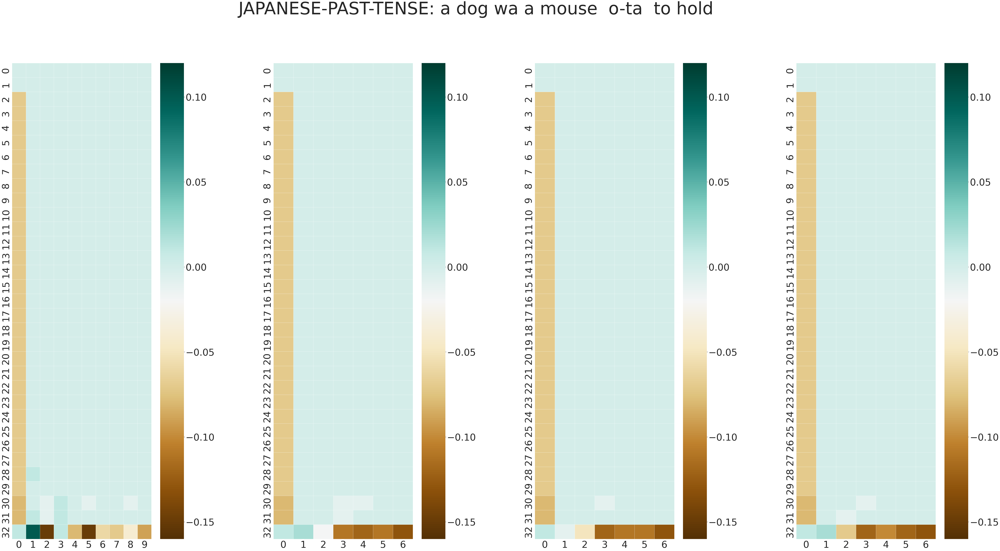

'a dog wa a mouse  o-ta  to hold'

In [111]:
sentence1 = jp_u_3_past_tense1 = {"0": {"0": -0.0, "1": 0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": 0.0, "9": -0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.01, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.01, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.01, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "29": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.01, "9": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "32": {"0": 0.01, "1": 0.07, "2": -0.09, "3": -0.02, "4": -0.05, "5": -0.13, "6": -0.03, "7": -0.03, "8": -0.01, "9": -0.06}}
sentence1 = jp_u_3_past_tense1 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "1": {"0": -0.0, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": 0.0, "9": -0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "8": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "12": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "18": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "29": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": 0.01, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.01, "9": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": 0.01, "4": 0.0, "5": -0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "32": {"0": 0.01, "1": 0.07, "2": -0.11, "3": -0.03, "4": -0.06, "5": -0.13, "6": -0.04, "7": -0.06, "8": -0.02, "9": -0.07}}
sentence1 = jp_u_3_past_tense1 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "1": {"0": -0.0, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": 0.0, "9": -0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "25": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": 0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.01, "4": -0.0, "5": -0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.0, "3": 0.01, "4": -0.0, "5": -0.01, "6": -0.0, "7": -0.0, "8": -0.01, "9": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.0, "3": 0.01, "4": 0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "32": {"0": 0.01, "1": 0.1, "2": -0.11, "3": 0.0, "4": -0.08, "5": -0.14, "6": -0.04, "7": -0.04, "8": -0.02, "9": -0.07}}
sentence1 = jp_u_3_past_tense1 = {"0": {"0": -0.0, "1": 0.0, "2": -0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "1": {"0": -0.0, "1": -0.0, "2": -0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "2": {"0": -0.07, "1": -0.0, "2": 0.0, "3": -0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "3": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "4": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": 0.0, "9": -0.0}, "5": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": 0.0, "9": -0.0}, "6": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "7": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "8": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "9": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "10": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "11": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "12": {"0": -0.07, "1": -0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "13": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "14": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "15": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "16": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "17": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": -0.0}, "18": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": -0.0}, "19": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": 0.0, "9": 0.0}, "20": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "21": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "22": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": 0.0, "5": 0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "23": {"0": -0.07, "1": 0.0, "2": 0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": 0.0, "7": 0.0, "8": -0.0, "9": 0.0}, "24": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "25": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "26": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "27": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "28": {"0": -0.07, "1": 0.01, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "29": {"0": -0.07, "1": 0.0, "2": -0.0, "3": 0.0, "4": -0.0, "5": -0.0, "6": -0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "30": {"0": -0.08, "1": 0.0, "2": -0.01, "3": 0.01, "4": -0.0, "5": -0.01, "6": -0.0, "7": -0.0, "8": -0.01, "9": -0.0}, "31": {"0": -0.08, "1": 0.01, "2": -0.01, "3": 0.01, "4": 0.0, "5": -0.0, "6": 0.0, "7": -0.0, "8": -0.0, "9": -0.0}, "32": {"0": 0.01, "1": 0.1, "2": -0.15, "3": 0.01, "4": -0.08, "5": -0.15, "6": -0.06, "7": -0.07, "8": -0.04, "9": -0.09}}

make_heatmap(sentence1, sentence2, sentence3, sentence4, "BrBG", "JAPANESE-PAST-TENSE: a dog wa a mouse  o-ta  to hold")

ngs['jp-u-3-past-tense'][5]
